## PREDICT COST ON MEDIA CAMPAIGNS IN FOOD MART OF USA .
ON THE BASIS OF 60K CUSTOMERS INCOME ,PRODUCT,PROMOTION AND STORE FEATURES.
### ABOUT FOODMART:

Food Mart (CFM) is a chain of convenience stores in the United States. The private company's headquarters are located in Mentor, Ohio, and there are currently approximately 325 stores located in the US. Convenient Food Mart operates on the franchise system.

Food Mart was the nation's third-largest chain of convenience stores as of 1988.

The NASDAQ exchange dropped Convenient Food Mart the same year when the company failed to meet financial reporting requirements.

Carden & Cherry advertised Convenient Food Mart with the Ernest character in the 1980s.

In [133]:
# from google.colab import drive
# drive.mount('/content/drive')

In [134]:
#Import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt,seaborn as sns,plotly.express as px
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

In [135]:
#Load the data using the pandas read function
data=pd.read_csv('/content/drive/MyDrive/media prediction and its cost.csv')
#Print the first five rows of the dataset
data.head().style.background_gradient(cmap='winter')

,food_category,food_department,food_family,store_sales(in millions),store_cost(in millions),unit_sales(in millions),promotion_name,sales_country,marital_status,gender,total_children,education,member_card,occupation,houseowner,avg_cars_at home(approx),avg. yearly_income,num_children_at_home,avg_cars_at home(approx).1,brand_name,SRP,gross_weight,net_weight,recyclable_package,low_fat,units_per_case,store_type,store_city,store_state,store_sqft,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,media_type,cost
0,Breakfast Foods,Frozen Foods,Food,7.360000,2.723200,4.000000,Bag Stuffers,USA,M,F,1.000000,Partial High School,Normal,Skilled Manual,Y,1.000000,$10K - $30K,1.000000,1.000000,Carrington,1.840000,19.700000,17.700000,1.000000,0.000000,17.000000,Deluxe Supermarket,Salem,OR,27694.000000,18670.000000,5415.000000,3610.000000,1.000000,1.000000,1.000000,1.000000,1.000000,"Daily Paper, Radio",126.620000
1,Breakfast Foods,Frozen Foods,Food,5.520000,2.594400,3.000000,Cash Register Lottery,USA,M,M,0.000000,Bachelors Degree,Silver,Professional,Y,4.000000,$50K - $70K,0.000000,4.000000,Carrington,1.840000,19.700000,17.700000,1.000000,0.000000,17.000000,Deluxe Supermarket,Salem,OR,27694.000000,18670.000000,5415.000000,3610.000000,1.000000,1.000000,1.000000,1.000000,1.000000,"Daily Paper, Radio",59.860000
2,Breakfast Foods,Frozen Foods,Food,3.680000,1.361600,2.000000,High Roller Savings,USA,S,F,4.000000,Partial High School,Normal,Manual,N,1.000000,$10K - $30K,0.000000,1.000000,Carrington,1.840000,19.700000,17.700000,1.000000,0.000000,17.000000,Deluxe Supermarket,Salem,OR,27694.000000,18670.000000,5415.000000,3610.000000,1.000000,1.000000,1.000000,1.000000,1.000000,"Daily Paper, Radio",84.160000
3,Breakfast Foods,Frozen Foods,Food,3.680000,1.177600,2.000000,Cash Register Lottery,USA,M,F,2.000000,High School Degree,Bronze,Manual,Y,2.000000,$30K - $50K,2.000000,2.000000,Carrington,1.840000,19.700000,17.700000,1.000000,0.000000,17.000000,Deluxe Supermarket,Salem,OR,27694.000000,18670.000000,5415.000000,3610.000000,1.000000,1.000000,1.000000,1.000000,1.000000,In-Store Coupon,95.780000
4,Breakfast Foods,Frozen Foods,Food,4.080000,1.428000,3.000000,Double Down Sale,USA,M,M,0.000000,Partial High School,Bronze,Skilled Manual,N,2.000000,$30K - $50K,0.000000,2.000000,Golden,1.360000,7.120000,5.110000,0.000000,1.000000,29.000000,Deluxe Supermarket,Salem,OR,27694.000000,18670.000000,5415.000000,3610.000000,1.000000,1.000000,1.000000,1.000000,1.000000,Radio,50.790000


In [136]:
#Data information to the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 40 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   food_category               60428 non-null  object 
 1   food_department             60428 non-null  object 
 2   food_family                 60428 non-null  object 
 3   store_sales(in millions)    60428 non-null  float64
 4   store_cost(in millions)     60428 non-null  float64
 5   unit_sales(in millions)     60428 non-null  float64
 6   promotion_name              60428 non-null  object 
 7   sales_country               60428 non-null  object 
 8   marital_status              60428 non-null  object 
 9   gender                      60428 non-null  object 
 10  total_children              60428 non-null  float64
 11  education                   60428 non-null  object 
 12  member_card                 60428 non-null  object 
 13  occupation                  604

# Let's check the shape of the dataset
data.shape

In [137]:
#Statstical analysis of the dataset
data.describe().style.background_gradient(cmap='gist_gray_r')

,store_sales(in millions),store_cost(in millions),unit_sales(in millions),total_children,avg_cars_at home(approx),num_children_at_home,avg_cars_at home(approx).1,SRP,gross_weight,net_weight,recyclable_package,low_fat,units_per_case,store_sqft,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost
count,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000,60428.000000
mean,6.541031,2.619460,3.093169,2.533875,2.200271,0.829351,2.200271,2.115258,13.806433,11.796289,0.558665,0.350434,18.860694,27988.477494,19133.799696,5312.852552,3541.846280,0.612646,0.354157,0.587956,0.587956,0.562603,99.262366
std,3.463047,1.453009,0.827677,1.490165,1.109644,1.303424,1.109644,0.932829,4.622693,4.682986,0.496551,0.477110,10.258555,5701.022090,3987.395735,1575.907263,1050.471635,0.487150,0.478261,0.492207,0.492207,0.496069,30.011257
min,0.510000,0.163200,1.000000,0.000000,0.000000,0.000000,0.000000,0.500000,6.000000,3.050000,0.000000,0.000000,1.000000,20319.000000,13305.000000,2452.000000,1635.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.790000
25%,3.810000,1.500000,3.000000,1.000000,1.000000,0.000000,1.000000,1.410000,9.700000,7.710000,0.000000,0.000000,10.000000,23593.000000,16232.000000,4746.000000,3164.000000,0.000000,0.000000,0.000000,0.000000,0.000000,69.650000
50%,5.940000,2.385600,3.000000,3.000000,2.000000,0.000000,2.000000,2.130000,13.600000,11.600000,1.000000,0.000000,19.000000,27694.000000,18670.000000,5062.000000,3375.000000,1.000000,0.000000,1.000000,1.000000,1.000000,98.520000
75%,8.670000,3.484025,4.000000,4.000000,3.000000,1.000000,3.000000,2.790000,17.700000,16.000000,1.000000,1.000000,28.000000,30797.000000,22123.000000,5751.000000,3834.000000,1.000000,1.000000,1.000000,1.000000,1.000000,126.620000
max,22.920000,9.726500,6.000000,5.000000,4.000000,5.000000,4.000000,3.980000,21.900000,20.800000,1.000000,1.000000,36.000000,39696.000000,30351.000000,9184.000000,6122.000000,1.000000,1.000000,1.000000,1.000000,1.000000,149.750000


# Correlation Matrix
# Why?
A correlation matrix is a table showing correlation coefficients between variables.

## There are three broad reasons for computing a correlation matrix:
To summarize a large amount of data where the goal is to see patterns. In our example above, the observable pattern is that all the variables highly correlate with each other.
To input into other analyses. For example, people commonly use correlation matrixes as inputs for exploratory factor analysis, confirmatory factor analysis, structural equation models, and linear regression when excluding missing values pairwise.
As a diagnostic when checking other analyses. For example, with linear regression, a high amount of correlations suggests that the linear regression estimates will be unreliable.

In [138]:
#Correlation of the dataset
data.corr().style.background_gradient(cmap='cividis_r')

,store_sales(in millions),store_cost(in millions),unit_sales(in millions),total_children,avg_cars_at home(approx),num_children_at_home,avg_cars_at home(approx).1,SRP,gross_weight,net_weight,recyclable_package,low_fat,units_per_case,store_sqft,grocery_sqft,frozen_sqft,meat_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost
store_sales(in millions),1.000000,0.954685,0.503482,0.083313,0.004498,0.032437,0.004498,0.833478,0.036179,0.032014,0.034293,-0.006134,-0.010630,0.015543,0.010442,0.017886,0.017883,-0.029368,0.019179,0.031459,0.031459,0.030603,-0.004621
store_cost(in millions),0.954685,1.000000,0.480087,0.079058,0.002865,0.027576,0.002865,0.795880,0.034237,0.030257,0.030213,-0.005976,-0.009792,0.017877,0.012884,0.019245,0.019242,-0.027126,0.019252,0.033206,0.033206,0.030929,-0.004162
unit_sales(in millions),0.503482,0.480087,1.000000,0.163188,0.023667,0.066725,0.023667,-0.002358,0.001255,0.001137,0.001599,-0.001129,0.000084,0.031464,0.024857,0.030563,0.030557,-0.057633,0.034996,0.057878,0.057878,0.055885,-0.015015
total_children,0.083313,0.079058,0.163188,1.000000,0.098110,0.394709,0.098110,0.000545,-0.000186,0.000142,0.002794,-0.002824,0.002307,0.000555,0.018526,-0.026926,-0.026923,0.002836,-0.000591,-0.013764,-0.013764,-0.003361,-0.003900
avg_cars_at home(approx),0.004498,0.002865,0.023667,0.098110,1.000000,0.130841,1.000000,-0.007921,0.004588,0.004155,0.003725,-0.004312,-0.007265,-0.015815,-0.017694,-0.007470,-0.007466,-0.002702,0.014001,-0.008982,-0.008982,-0.004138,0.011658
num_children_at_home,0.032437,0.027576,0.066725,0.394709,0.130841,1.000000,0.130841,-0.000477,-0.002480,-0.002535,0.001380,-0.001818,0.000118,0.006150,0.025008,-0.024624,-0.024617,-0.016873,-0.013750,-0.023680,-0.023680,-0.008918,-0.002549
avg_cars_at home(approx).1,0.004498,0.002865,0.023667,0.098110,1.000000,0.130841,1.000000,-0.007921,0.004588,0.004155,0.003725,-0.004312,-0.007265,-0.015815,-0.017694,-0.007470,-0.007466,-0.002702,0.014001,-0.008982,-0.008982,-0.004138,0.011658
SRP,0.833478,0.795880,-0.002358,0.000545,-0.007921,-0.000477,-0.007921,1.000000,0.043332,0.038639,0.042013,-0.005527,-0.011951,0.001663,-0.000505,0.004375,0.004374,-0.000014,0.002031,0.002811,0.002811,0.003998,0.002082
gross_weight,0.036179,0.034237,0.001255,-0.000186,0.004588,-0.002480,0.004588,0.043332,1.000000,0.988903,0.052340,-0.033883,-0.011754,-0.005254,-0.004749,-0.004195,-0.004195,0.001933,0.002293,0.001944,0.001944,0.003109,0.001281
net_weight,0.032014,0.030257,0.001137,0.000142,0.004155,-0.002535,0.004155,0.038639,0.988903,1.000000,0.054580,-0.036211,-0.014394,-0.004374,-0.003723,-0.003843,-0.003842,0.001816,0.002551,0.002656,0.002656,0.002579,0.001343


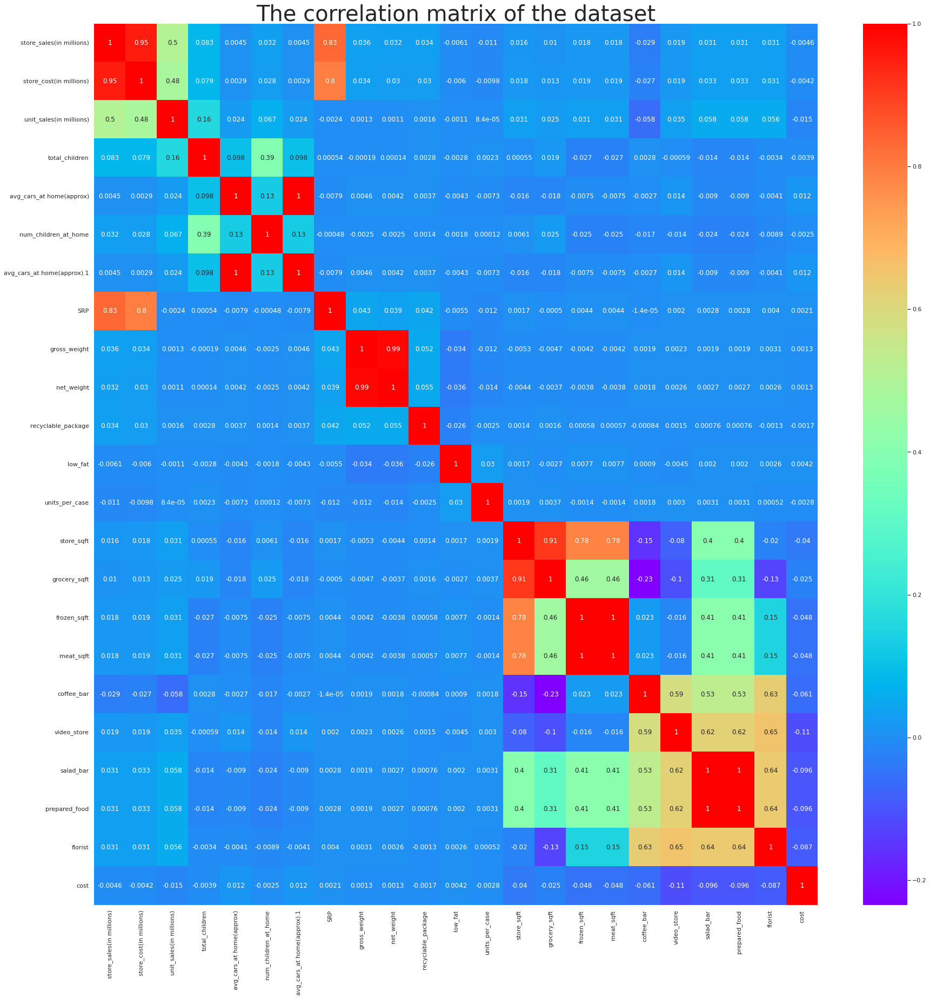

In [139]:
# Correlation metrix using seaborn as heatmap
plt.figure(figsize=(30,30))
sns.heatmap(data.corr(),cmap='rainbow',annot=True)
plt.title("The correlation matrix of the dataset",fontsize=40)
plt.show()

# EDA PROCESS

In [140]:
#Dataset columns
data.columns

Index(['food_category', 'food_department', 'food_family',
       'store_sales(in millions)', 'store_cost(in millions)',
       'unit_sales(in millions)', 'promotion_name', 'sales_country',
       'marital_status', 'gender', 'total_children', 'education',
       'member_card', 'occupation', 'houseowner', 'avg_cars_at home(approx)',
       'avg. yearly_income', 'num_children_at_home',
       'avg_cars_at home(approx).1', 'brand_name', 'SRP', 'gross_weight',
       'net_weight', 'recyclable_package', 'low_fat', 'units_per_case',
       'store_type', 'store_city', 'store_state', 'store_sqft', 'grocery_sqft',
       'frozen_sqft', 'meat_sqft', 'coffee_bar', 'video_store', 'salad_bar',
       'prepared_food', 'florist', 'media_type', 'cost'],
      dtype='object')

# A pie chart is a circular statistical chart, which is divided into sectors to illustrate numerical proportion.

If you're looking instead for a multilevel hierarchical pie-like chart, go to the Sunburst tutorial.

# Pie chart with plotly express

# To visualize the food_categorty in dataset

In [141]:
#Let's visualize the food_categorty in the dataset using the plotly
fig=px.pie(data,names='food_category',title='To Visualize the food_category in dataset',hole=.3,labels=['Breakfast Foods', 'Bread', 'Canned Shrimp', 'Baking Goods',
       'Vegetables', 'Frozen Desserts', 'Candy', 'Snack Foods', 'Dairy',
       'Starchy Foods', 'Cleaning Supplies', 'Decongestants', 'Meat',
       'Hot Beverages', 'Jams and Jellies', 'Carbonated Beverages',
       'Seafood', 'Specialty', 'Kitchen Products', 'Electrical',
       'Beer and Wine', 'Candles', 'Fruit', 'Pure Juice Beverages',
       'Canned Soup', 'Paper Products', 'Canned Tuna', 'Eggs', 'Hardware',
       'Canned Sardines', 'Canned Clams', 'Pain Relievers', 'Side Dishes',
       'Bathroom Products', 'Magazines', 'Frozen Entrees', 'Pizza',
       'Cold Remedies', 'Canned Anchovies', 'Drinks', 'Hygiene',
       'Plastic Products', 'Canned Oysters', 'Packaged Vegetables',
       'Miscellaneous'],width=1000, height=600)
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

# Observation:
From the above pie chart most used food_category such as 
1.Vegetables
2.Snack Foods 
3.Dairy these products we used in our daily life

# To visualize the food_department in the dataset

In [142]:
#Let's create a pie chart using the plotly to visualize the food_department in dataset
fig = go.Figure(data=[go.Pie(labels=['Frozen Foods', 'Baked Goods', 'Canned Foods', 'Baking Goods',
       'Produce', 'Snacks', 'Snack Foods', 'Dairy', 'Starchy Foods',
       'Household', 'Health and Hygiene', 'Meat', 'Beverages', 'Seafood',
       'Deli', 'Alcoholic Beverages', 'Canned Products', 'Eggs',
       'Periodicals', 'Breakfast Foods', 'Checkout', 'Carousel'],values=data['food_department'].value_counts(),title='To Visualize the food_department in dataset')])
#update the piecchar with colors and text infor and border withe line 
fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=10,
                  marker=dict(colors=['Crimson','Chocolate','mediumturquoise', 'darkorange', 'lightgreen','Olive','MintCream','Orchid','MediumAquaMarine'], line=dict(color='#000080', width=2)))
fig.show()

# Observation:


# To Visualize the sales_country in the dataset

In [143]:
#Let's create a pie chart to viusalize the sales_country in the dataset with the parametes
fig=px.pie(data,names='sales_country',title='To Visualize the sales_country in dataset',labels=['USA', 'Mexico', 'Canada'],color_discrete_sequence=['Purple','Yellow','Tomato'],width=500, height=500)
#update the pie chart with the colors and border line and finally visualized
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

# Observation:
From the above pie chart most sales done in the USA,After that Mexico and finaly leaset sales done in the canada

# Count Plot
A countplot is kind of like a histogram or a bar graph for some categorical area.

It simply shows the number of occurrences of an item based on a certain type of category.

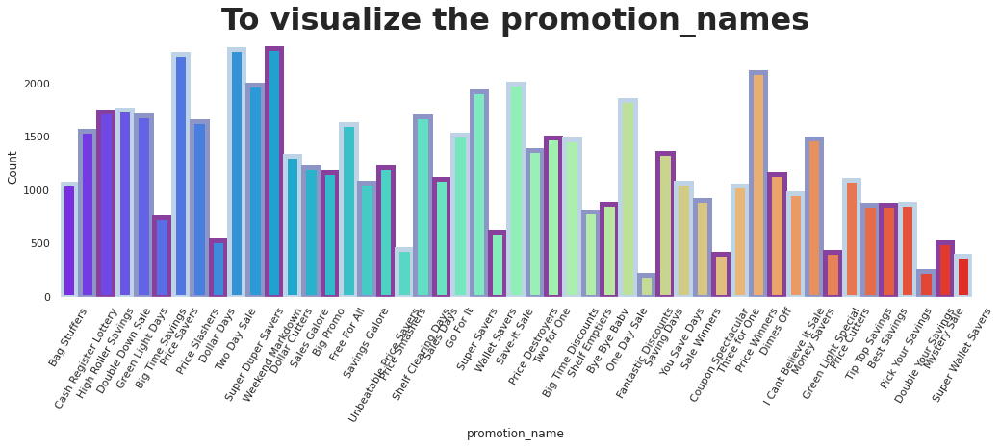

In [144]:
plt.figure(figsize=(17,5))
# count plot of whole datset based on promotion_name
ax=plt.axes()
#Set the background color
ax.set(facecolor='white')
#set the figure size and style
sns.set(rc={'figure.figsize':(10,4)},style='dark')
#create the title of the plot
ax.set_title("To visualize the promotion_names",fontsize=32,fontweight='bold')
#create the countplot using the seaborn with the paramets
sns.countplot(data['promotion_name'],palette='rainbow',linewidth=5,edgecolor=sns.color_palette("BuPu", 3))
#on the x-axis the promotion_names
plt.xlabel('promotion_name')
#on the y_axis the count of the promotion
plt.ylabel('Count')
#creat the ticks on x axis beacause to visualize the botom promotion_names
plt.xticks(rotation=60)
#finaly visualize it 
plt.show()

# Observation:
From the above count plot the most sales promotors names such as 
###### 1. Weekend Markdown
###### 2. Two Day Sales
###### 3.Price Slashers

# To viusalize the avg. yearly_income using the count plot

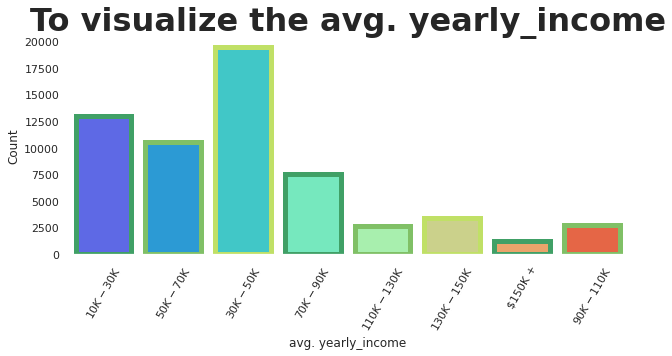

In [145]:
# count plot of whole datset based on avg. yearly_income
ax=plt.axes()
#Set the background color
ax.set(facecolor='white')
#set the figure size and style
sns.set(rc={'figure.figsize':(8,4)},style='dark')
#create the title of the plot
ax.set_title("To visualize the avg. yearly_income",fontsize=32,fontweight='bold')
#create the countplot using the seaborn with the paramets
sns.countplot(data['avg. yearly_income'],palette='rainbow',linewidth=5,edgecolor=sns.color_palette("summer", 3))
#on the x-axis the promotion_names
plt.xlabel('avg. yearly_income')
#on the y_axis the count of the promotion
plt.ylabel('Count')
#creat the ticks on x axis beacause to visualize the botom avg. yearly_income
plt.xticks(rotation=60)
#finaly visualize it 
plt.show()

# Histograms


In statistics, a histogram is representation of the distribution of numerical data, where the data are binned and the count for each bin is represented. More generally, in Plotly a histogram is an aggregated bar chart, with several possible aggregation functions (e.g. sum, average, count...) which can be used to visualize data on categorical and date axes as well as linear axes.



# To  visualize the Education with gender in the dataset using the histogram

In [146]:
#Let's create the histogram to visualize the To visualize the education with gender
#Create the histogram to visuzlized
fig=px.histogram(data,x='education',color='gender',title='To visualize the education with gender',width=500, height=500)
fig.update_layout(
    title_text='Sampled Results', # title of plo
    bargap=0.2, # gap between bars of adjacent location coordinates
    bargroupgap=0.1, # gap between bars of the same location coordinates
)
fig.show()

In [147]:
#Let's create the histogram to visualize the To visualize the occupation with gender
#Create the histogram to visuzlized
ax.set(facecolor='black')
fig=px.histogram(data,x='occupation',color='gender',title='To visualize the education with gender',width=800, height=500)
fig.update_layout(bargap=0.2,bargroupgap=0.1,)
fig.show()

In [148]:
#Let's create the histogram to visualize the To visualize the occupation with brand_name
#Create the histogram to visuzlized
fig=px.histogram(data,color='occupation',x='brand_name',title='To visualize the brand_name with occupation',width=1000, height=500)
fig.update_layout(bargap=0.2,bargroupgap=0.1,)
fig.show()

# Observation:
## For Male:
1.Most Male person have the partial high scholl and high school degree
2.Les number have males have Graduate degree
## For Female:
1.Most FeMale person have the partial high scholl and high school degree
2.Les number have Females have Graduate degree

In [149]:
#to visaulize the occupation with education using the bar plotly express
fig = px.histogram(data, color='avg. yearly_income', x='member_card',title='To visualize the avg. yearly_income with member_card',width=800, height=500)
fig.update_layout(bargap=0.2,bargroupgap=0.1)
fig.show()

In [150]:
#to visaulize the occupation with education using the bar plotly express
fig = px.histogram(data, color='occupation', x='education',title='To visualize the education with occupation',width=800, height=500)
fig.update_layout(bargap=0.2,bargroupgap=0.1)
fig.show()

In [151]:
#to visaulize the occupation with avg. yearly_income using the bar plotly express
fig = px.histogram(data, color='occupation', x='avg. yearly_income',title='To visualize the avg. yearly_income with occupation',width=800, height=500)
fig.update_layout(bargap=0.2,bargroupgap=0.1)
fig.show()

# Information:
####  From the Professional empolyee average earn 50K-
####  From the skilled Manual Employee and Manual Employee 30 K-
####  From the Management Employee earn 70 K-
####  From Clerical Employee Earn 30K-

In [152]:
#to visaulize the store_sales(in millions) with store_city using the bar plotly express
fig = px.histogram(data, x='store_sales(in millions)', color='store_city',title='To visualize the avg. yearly_income with occupation',width=1000, height=500)
fig.update_layout(bargap=0.2,bargroupgap=0.1)
fig.show()

In [153]:
#to visaulize the store_sales(in millions) with store_state using the bar plotly express
fig = px.histogram(data, color='store_type', x='store_state',title='To visualize the store_type with store_state',width=800, height=500)
fig.update_layout(bargap=0.02,bargroupgap=0.01)
fig.show()

# DISTPLOT
The distplot represents the univariate distribution of data i.e. data distribution of a variable against the density distribution

<Figure size 1080x576 with 0 Axes>

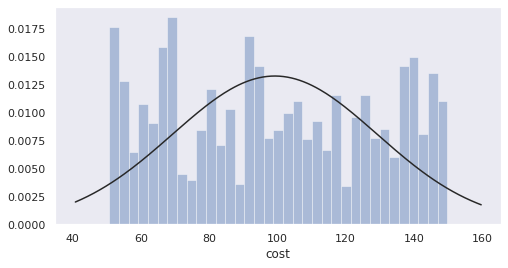

<Figure size 1080x576 with 0 Axes>

In [154]:
#import the norm from scipy
from scipy.stats import norm
#Visualize the distplot
sns.distplot(data['cost'],fit=norm,kde=False)
plt.figure(figsize=(15,8))

store_sales(in millions)


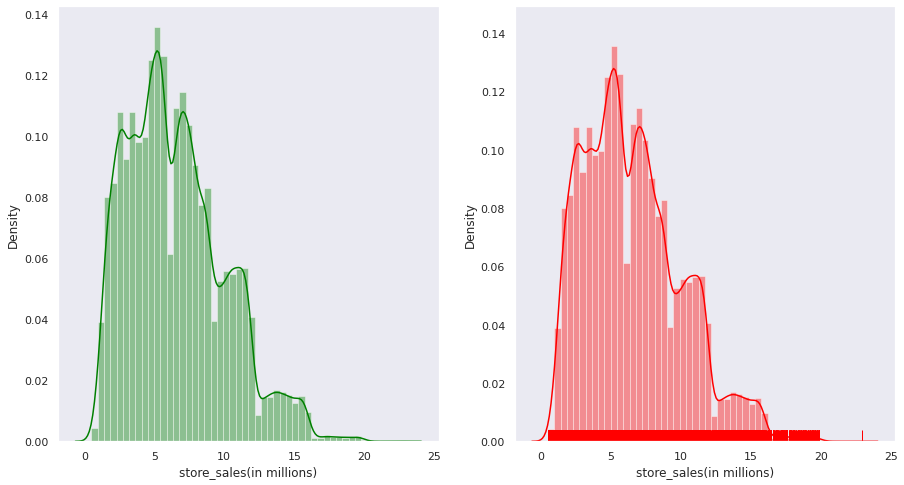

store_cost(in millions)


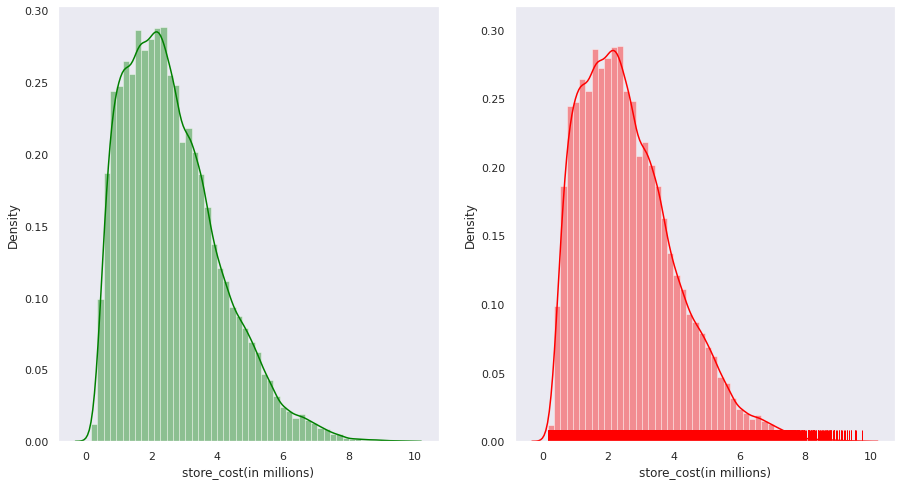

unit_sales(in millions)


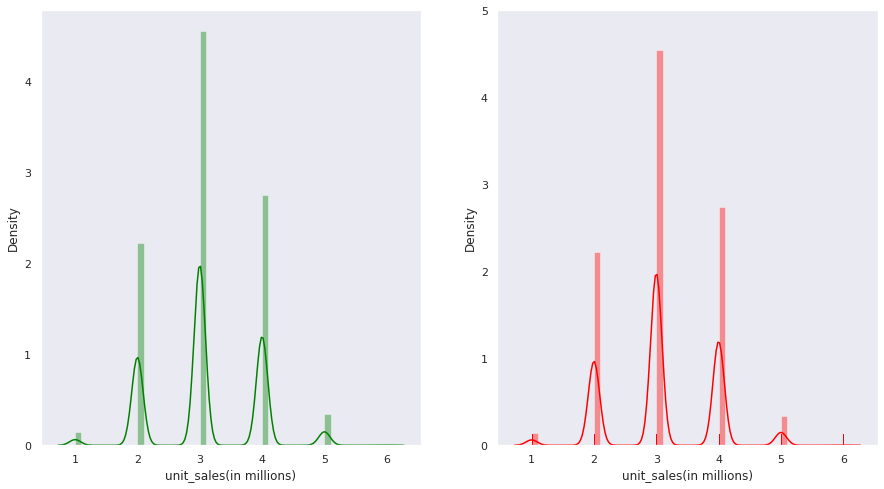

total_children


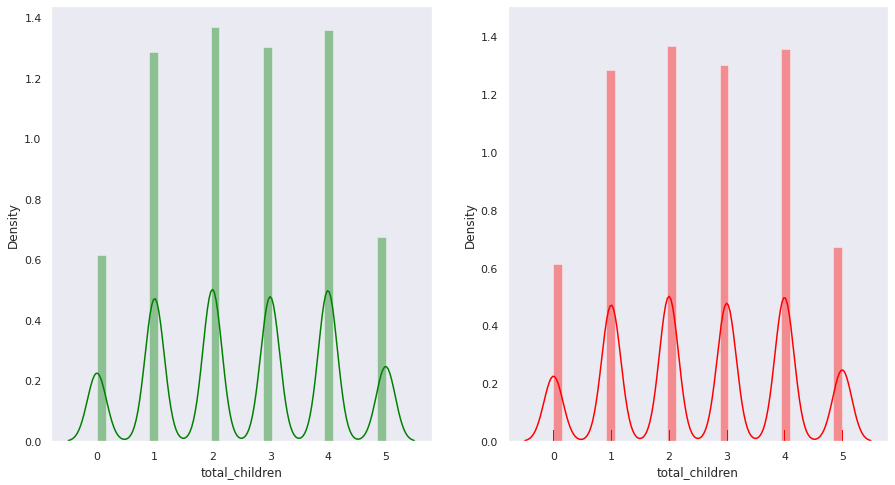

avg_cars_at home(approx)


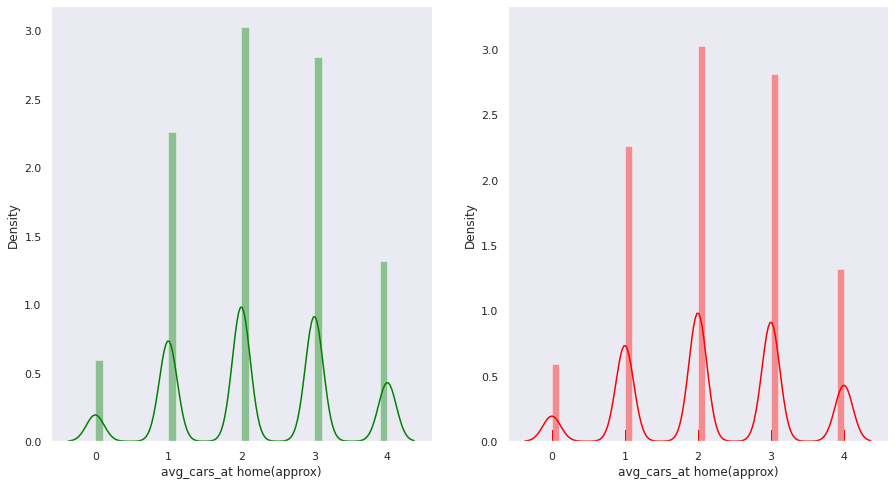

num_children_at_home


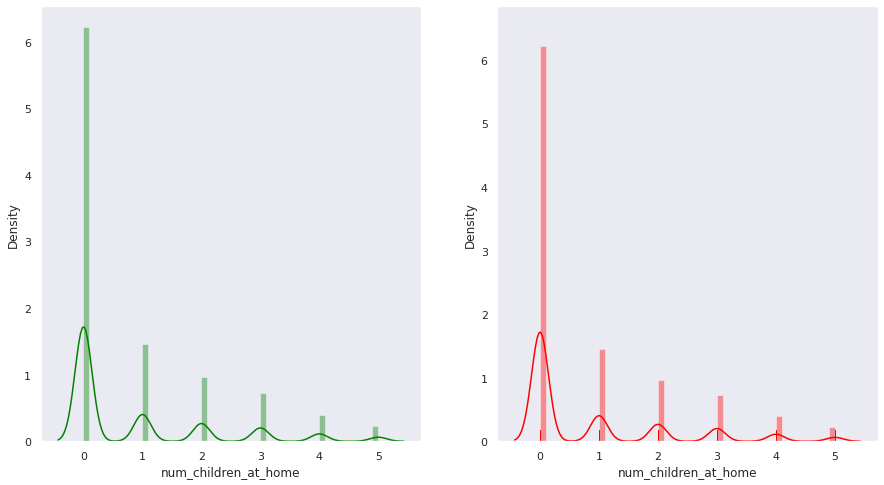

avg_cars_at home(approx).1


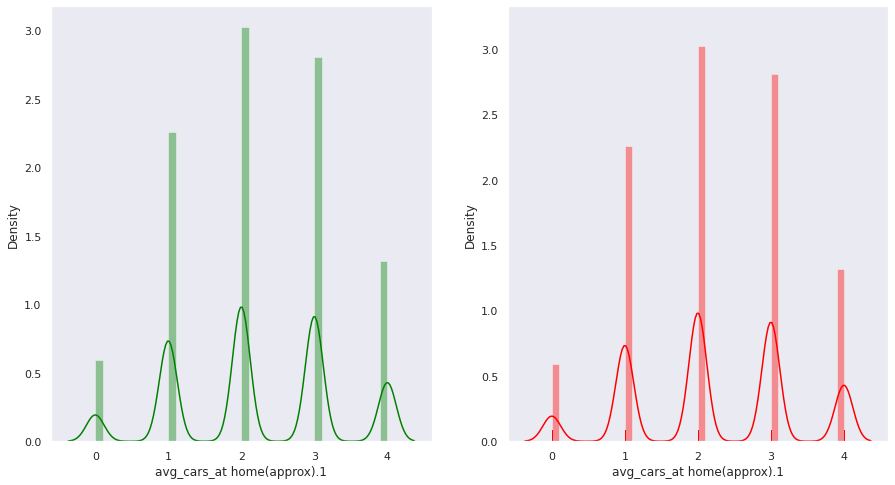

SRP


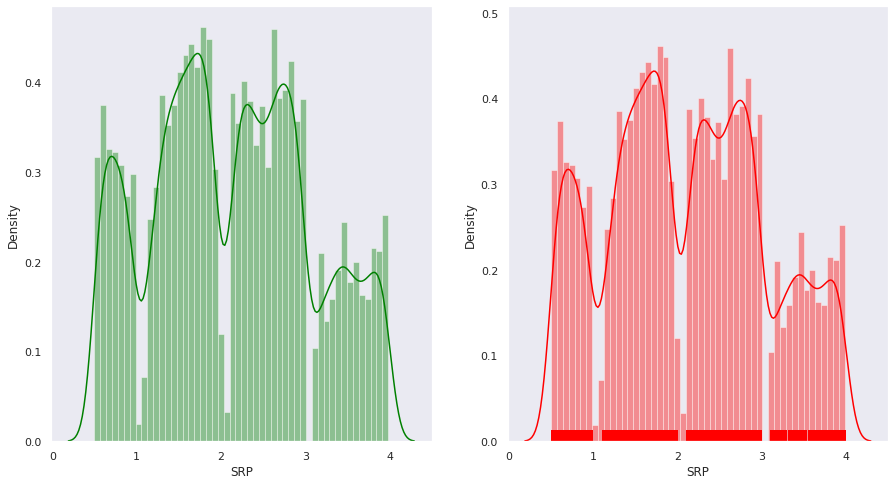

gross_weight


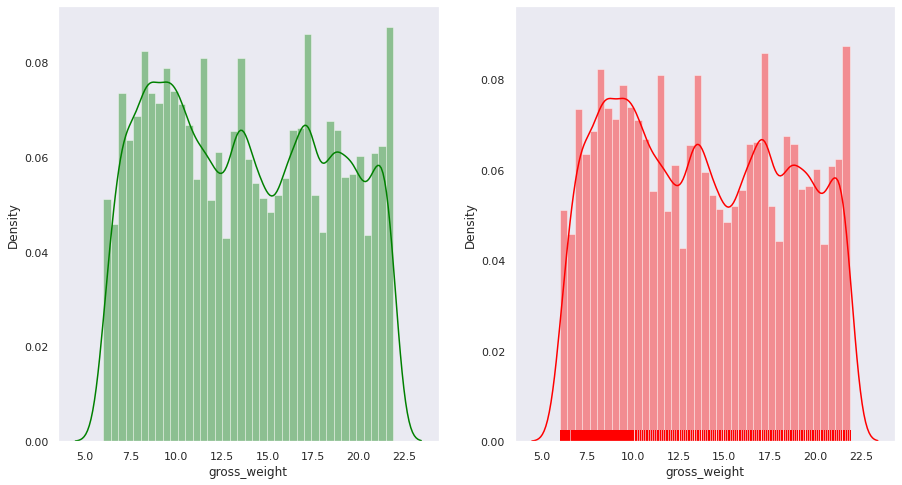

net_weight


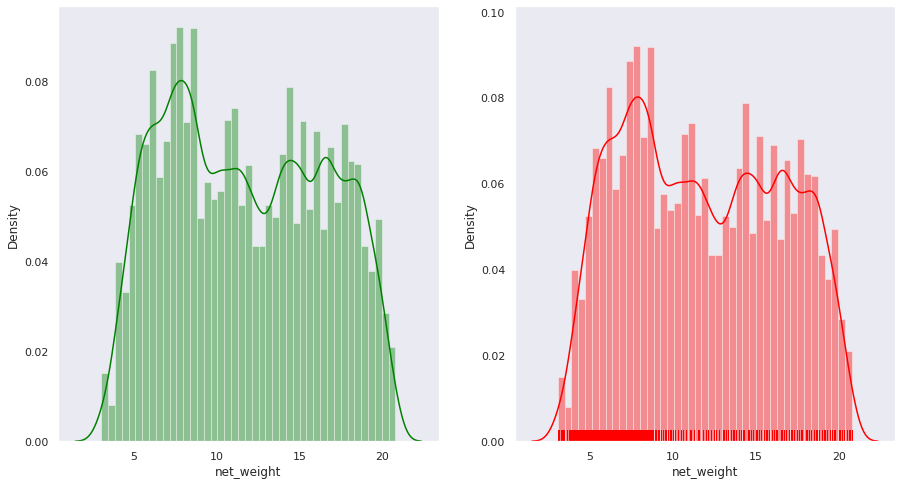

recyclable_package


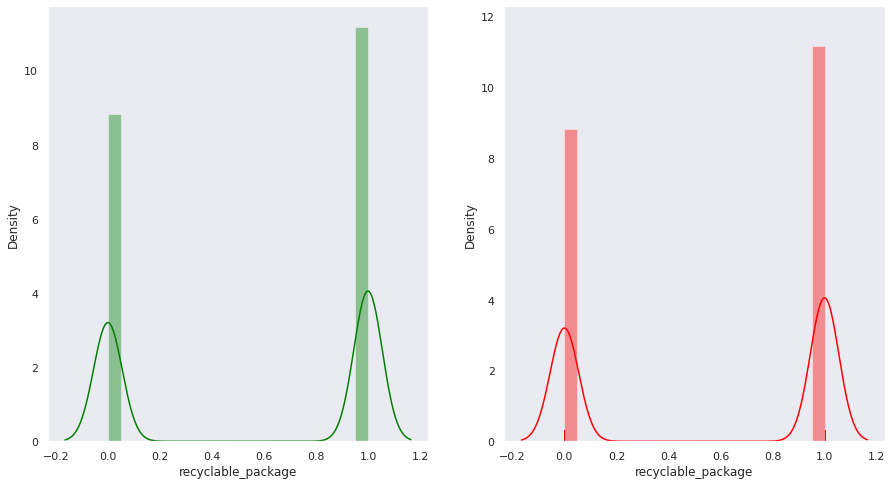

low_fat


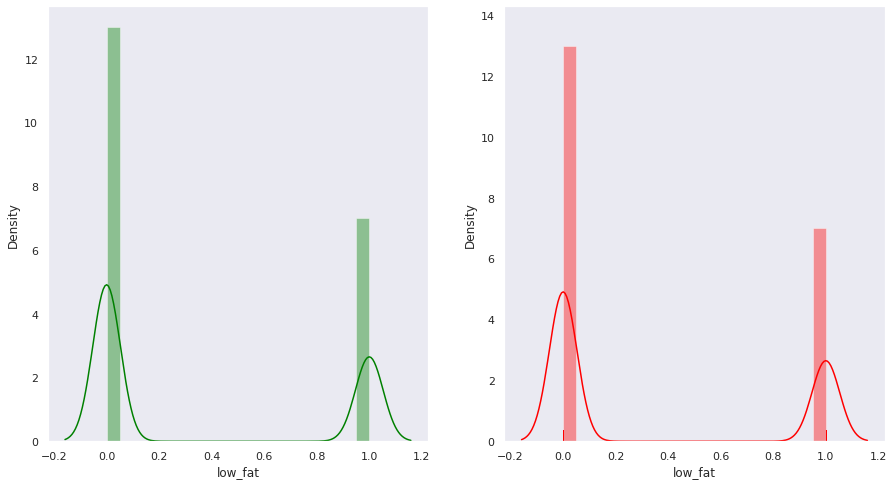

units_per_case


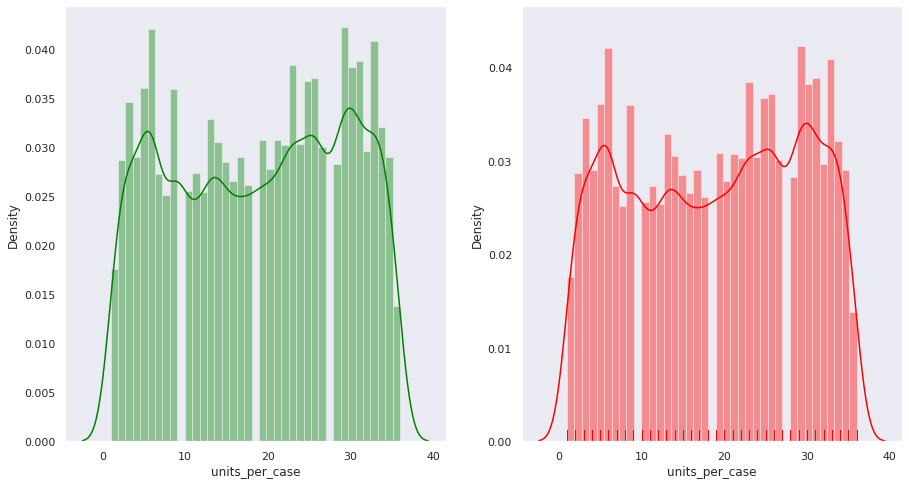

store_sqft


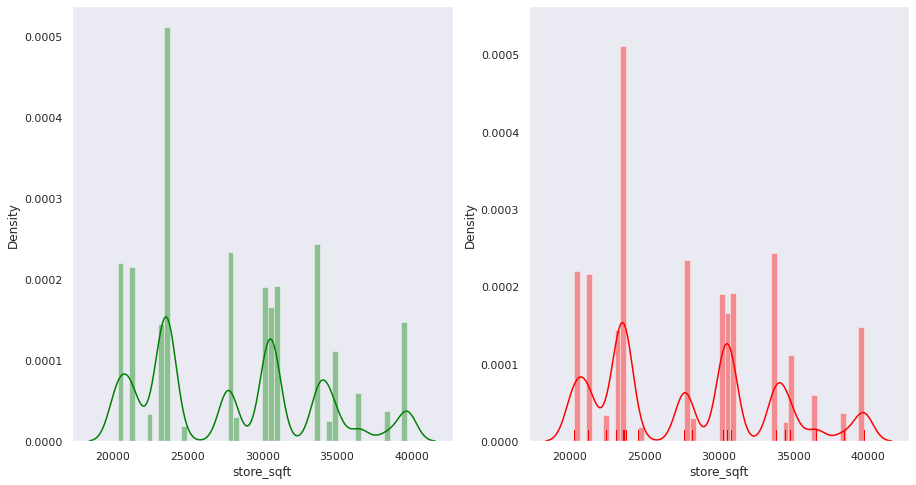

grocery_sqft


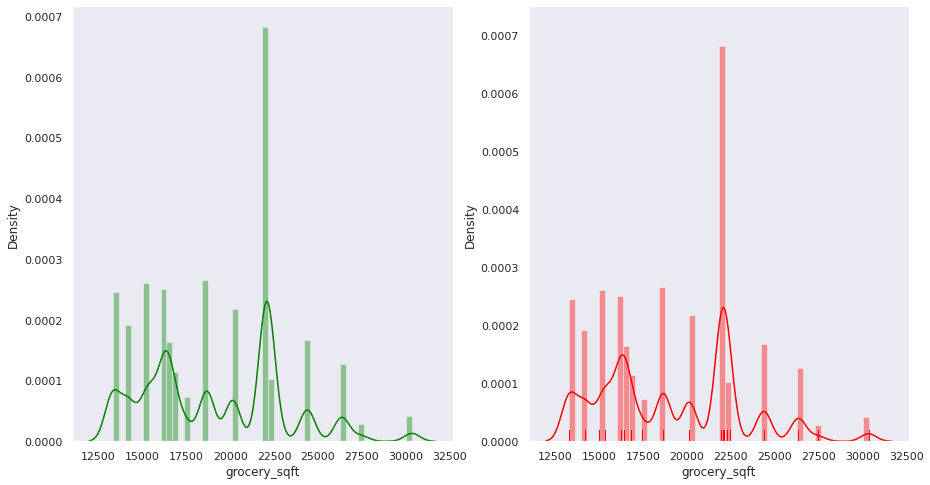

frozen_sqft


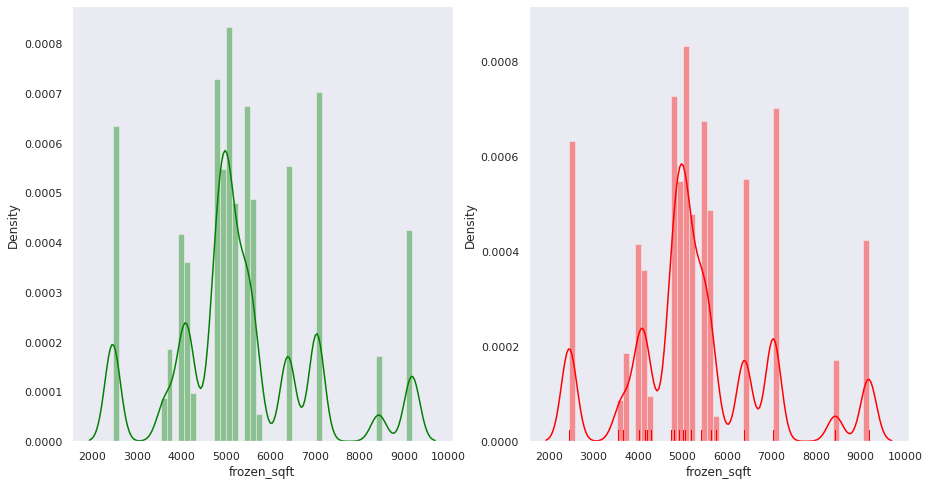

meat_sqft


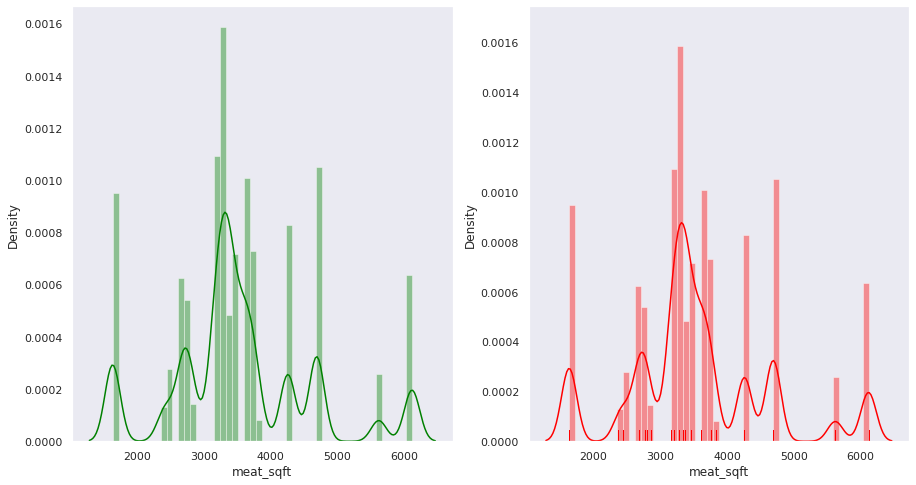

coffee_bar


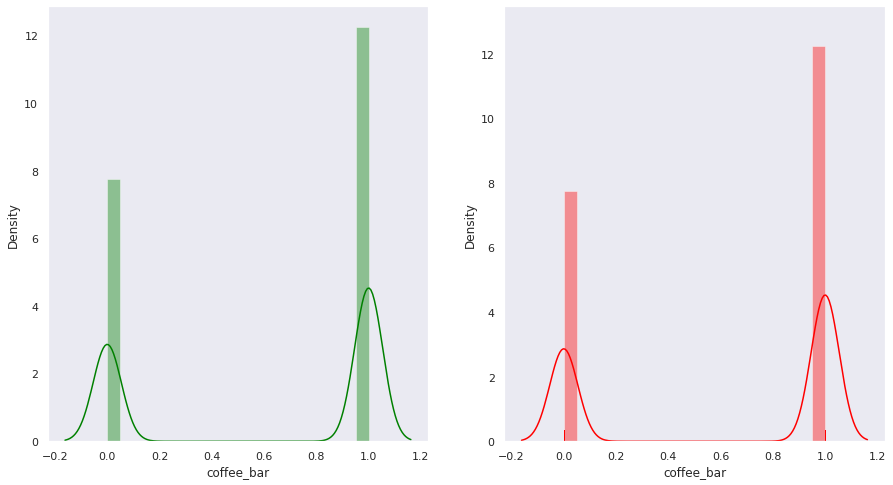

video_store


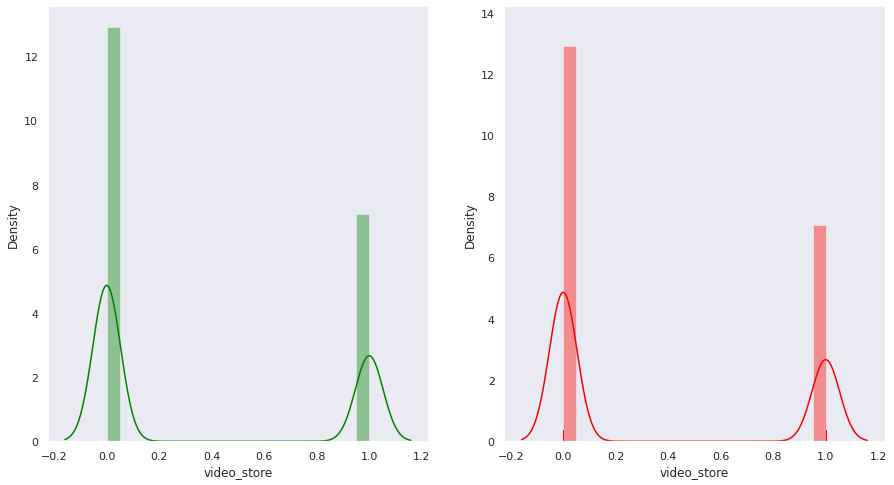

salad_bar


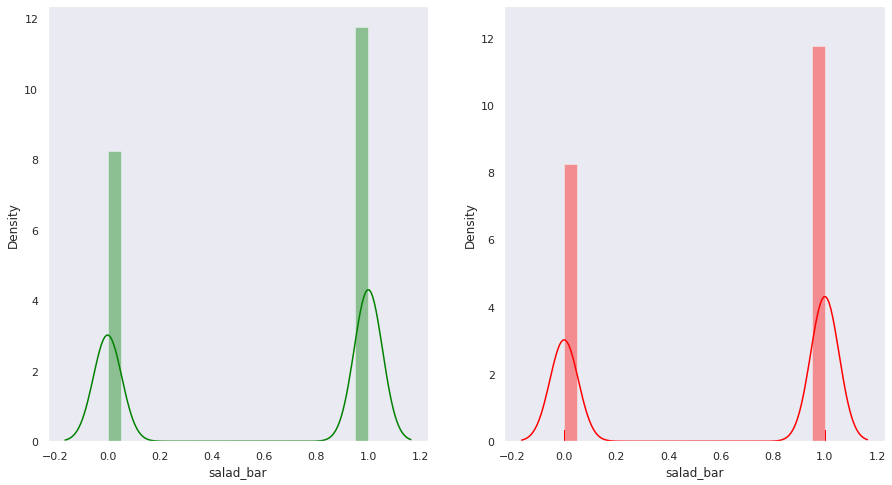

prepared_food


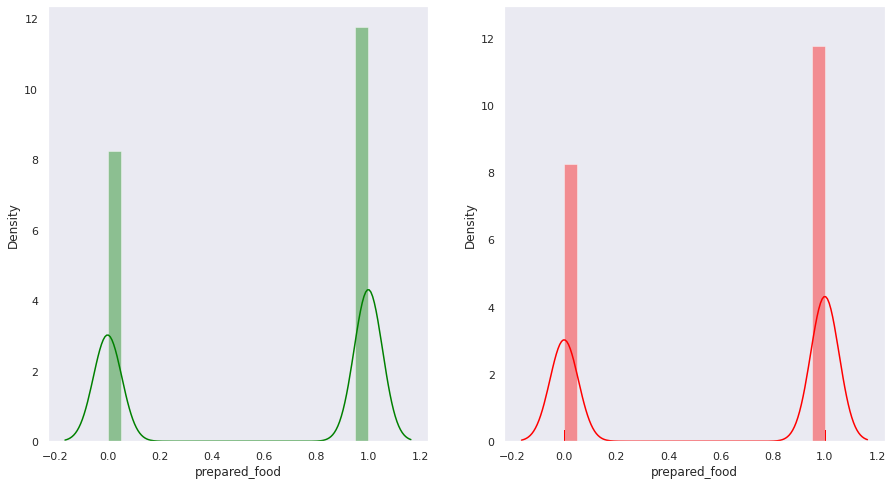

In [155]:
#Perform distplot for all the columns in dataset
col=data[['store_sales(in millions)','store_cost(in millions)','unit_sales(in millions)','total_children','avg_cars_at home(approx)','num_children_at_home','avg_cars_at home(approx).1','SRP', 'gross_weight',
    'net_weight', 'recyclable_package', 'low_fat', 'units_per_case','store_sqft', 'grocery_sqft',   'frozen_sqft', 'meat_sqft', 'coffee_bar', 'video_store', 'salad_bar',     'prepared_food']]
for column in col.columns:
    print(column)
    # code below
    fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(15,8))
    sns.distplot(data[column],ax=ax[0],color='green',hist=True)
    sns.distplot(data[column],ax=ax[1],rug=True,hist=True,color='red')
  
    plt.show()

In [156]:
# violin plot for store_sales(in millions) and store_cost(in millions) columns
fig=px.violin(data,x='store_sales(in millions)', y='store_cost(in millions)',title="The relation between store_sales(in millions) and store_cost(in millions)",width=800,height=500)
fig.show()

In [157]:
# violin plot for store_sqft and grocery_sqft columns
fig=px.scatter(data,x='store_sqft', y='grocery_sqft',title="The relation between store_sqft and grocery_sqft",width=800,height=500)
fig.update_layout(bargap=0.2,bargroupgap=0.1)
fig.show()

# Point Plot
A point plot uses scatter plot glyphs to visualize features like point estimates and confidence intervals.

A point plot uses scatter plot points to represent the central tendency of numeric data.

These plots make use of error bars to indicate any uncertainty around the numeric



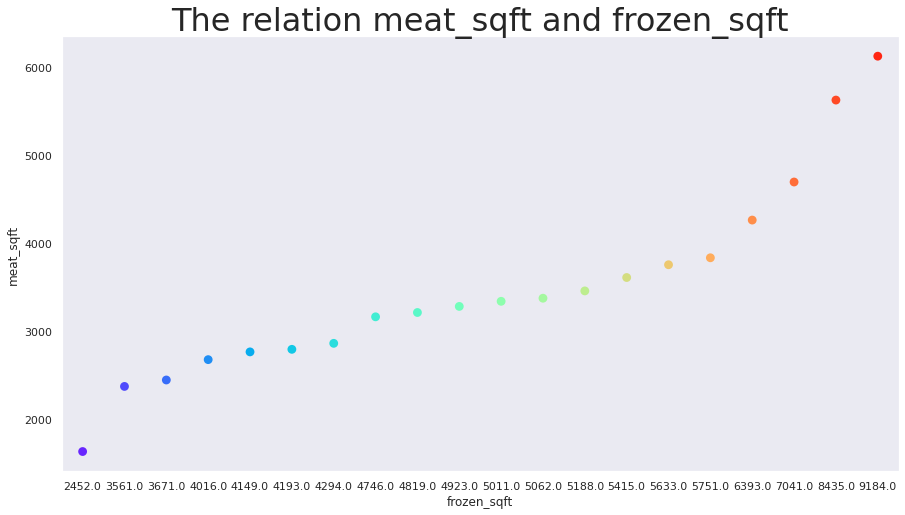

In [158]:
# point plot for milesFromMetropolis from salary columns
plt.figure(figsize=(15,8))
sns.pointplot(x='frozen_sqft', y='meat_sqft', data=data, palette='rainbow')
plt.title("The relation meat_sqft and frozen_sqft",fontsize=32)
plt.show()

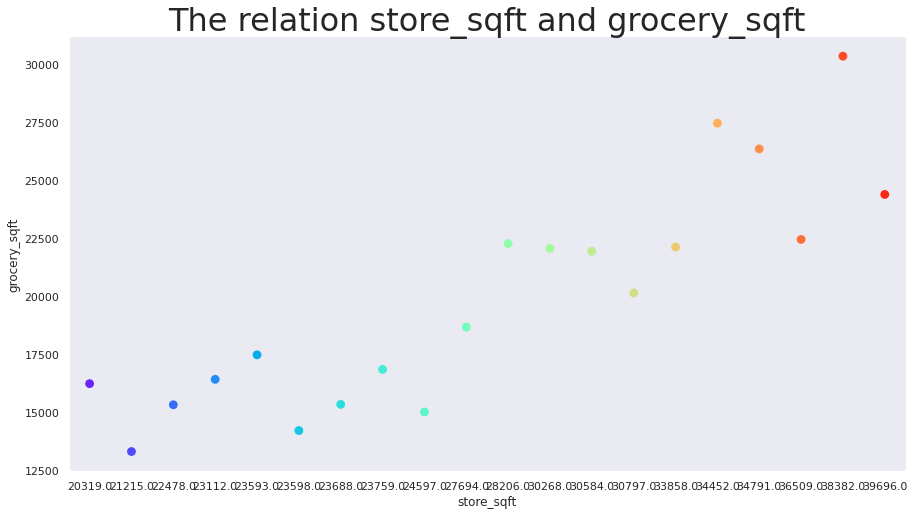

In [159]:
#To visualize the pointplot grocery_sqft and store_sqft
plt.figure(figsize=(15,8))
sns.pointplot(x='store_sqft', y='grocery_sqft', data=data, palette='rainbow')
plt.title("The relation store_sqft and grocery_sqft",fontsize=32)
plt.show()

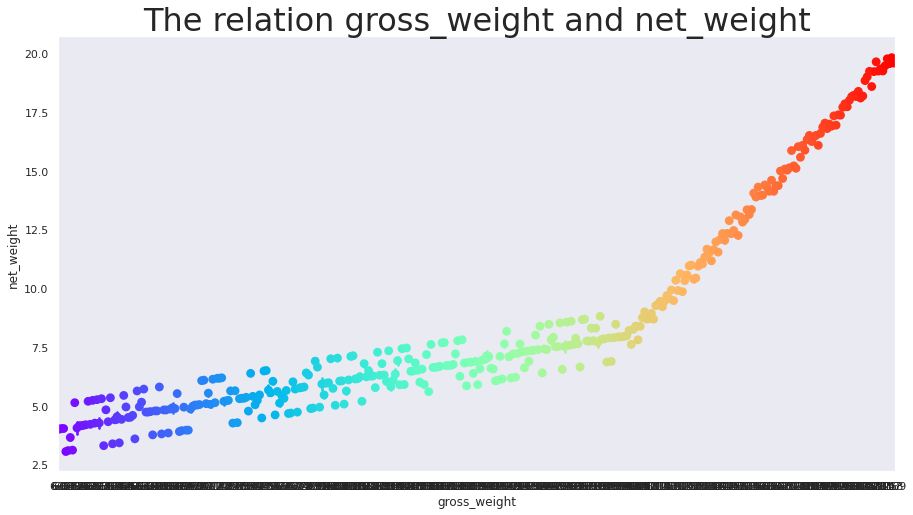

In [160]:
#To visualize the pointplot gross_weight and net_weight
plt.figure(figsize=(15,8))
sns.pointplot(x='gross_weight', y='net_weight', data=data, palette='rainbow')
plt.title("The relation gross_weight and net_weight",fontsize=32)
plt.show()

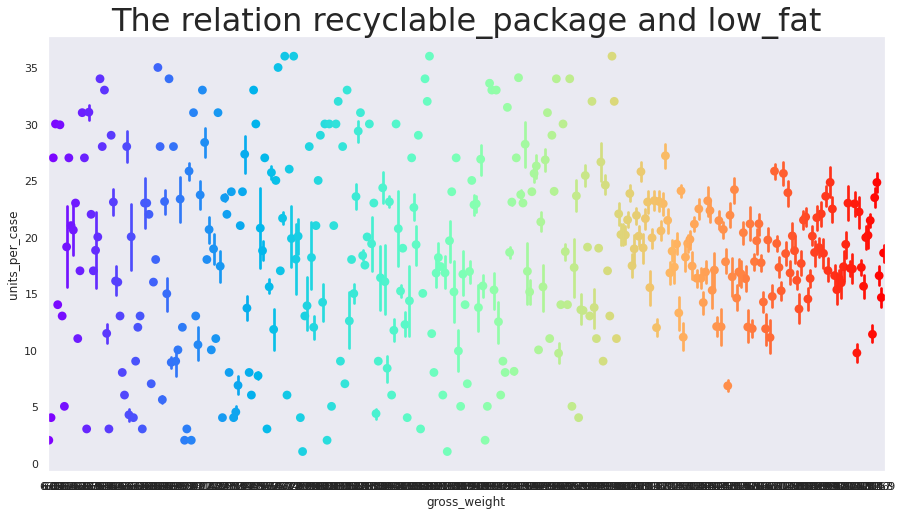

In [161]:
#To visualize the pointplot gross_weight and units_per_case
plt.figure(figsize=(15,8))
sns.pointplot(x='gross_weight', y='units_per_case', data=data, palette='rainbow')
plt.title("The relation recyclable_package and low_fat",fontsize=32)
plt.show()

# Strip Plot
A strip plot is a graphical data anlysis technique for summarizing a univariate data set. The strip plot consists of:

1. Horizontal axis = the value of the response variable;
2. Verticalal axis = all values are set to 1.

That is, a strip plot is simply a plot of the sorted response values along one axis. The strip plot is an alternative to a histogram or a density plot. It is typically used for small data sets (histograms and density plots are typically preferred for larger data sets).

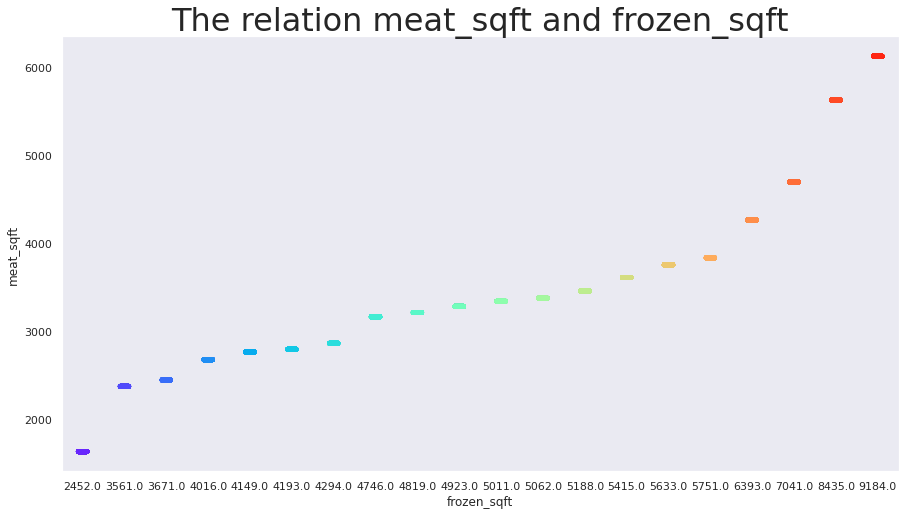

In [162]:
# point stripplot for milesFromMetropolis from salary columns
plt.figure(figsize=(15,8))
sns.stripplot(x='frozen_sqft', y='meat_sqft', data=data, palette='rainbow')
plt.title("The relation meat_sqft and frozen_sqft",fontsize=32)
plt.show()

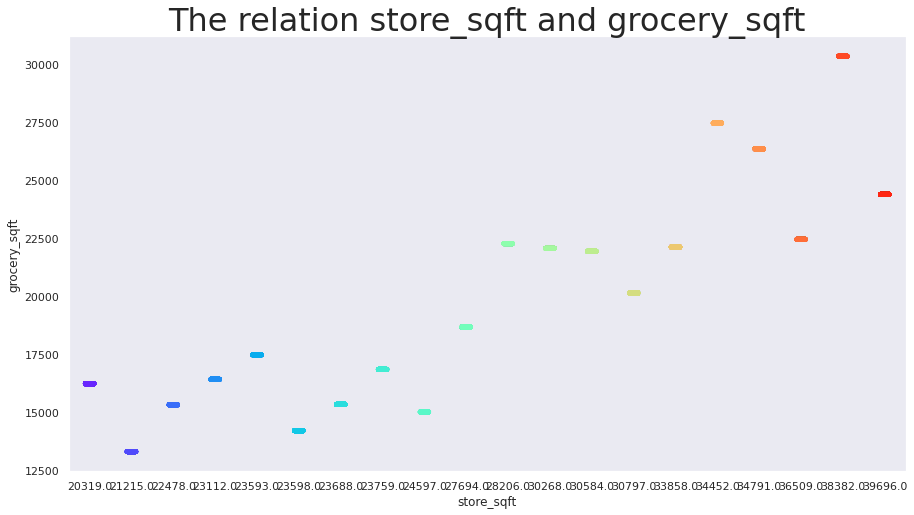

In [163]:
#To stripplot the pointplot grocery_sqft and store_sqft
plt.figure(figsize=(15,8))
sns.stripplot(x='store_sqft', y='grocery_sqft', data=data, palette='rainbow')
plt.title("The relation store_sqft and grocery_sqft",fontsize=32)
plt.show()

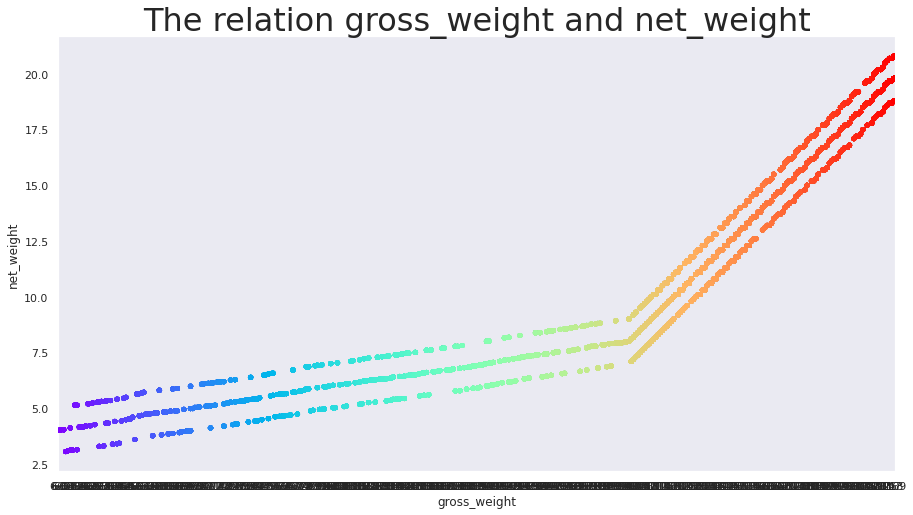

In [164]:
#To visualize the pointplot gross_weight and net_weight
plt.figure(figsize=(15,8))
sns.stripplot(x='gross_weight', y='net_weight', data=data, palette='rainbow')
plt.title("The relation gross_weight and net_weight",fontsize=32)
plt.show()

In [165]:
#Check the columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60428 entries, 0 to 60427
Data columns (total 40 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   food_category               60428 non-null  object 
 1   food_department             60428 non-null  object 
 2   food_family                 60428 non-null  object 
 3   store_sales(in millions)    60428 non-null  float64
 4   store_cost(in millions)     60428 non-null  float64
 5   unit_sales(in millions)     60428 non-null  float64
 6   promotion_name              60428 non-null  object 
 7   sales_country               60428 non-null  object 
 8   marital_status              60428 non-null  object 
 9   gender                      60428 non-null  object 
 10  total_children              60428 non-null  float64
 11  education                   60428 non-null  object 
 12  member_card                 60428 non-null  object 
 13  occupation                  604

# Modeling 

In [166]:
#Convert the categorical columns to numerical using the LabelEncoder
from sklearn.preprocessing import LabelEncoder
label=LabelEncoder()
data['food_category']=label.fit_transform(data['food_category'])             
data['food_department']=label.fit_transform(data['food_department'])           
data['food_family']=label.fit_transform(data['food_family']) 
data['promotion_name']=label.fit_transform(data['promotion_name']) 
data['sales_country']=label.fit_transform(data['sales_country']) 
data['marital_status']=label.fit_transform(data['marital_status']) 
data['gender']=label.fit_transform(data['gender']) 
data['education']=label.fit_transform(data['education']) 
data['member_card']=label.fit_transform(data['member_card']) 
data['occupation']=label.fit_transform(data['occupation']) 
data['avg. yearly_income']=label.fit_transform(data['avg. yearly_income']) 
data['brand_name']=label.fit_transform(data['brand_name']) 
data['houseowner']=label.fit_transform(data['houseowner']) 
data['store_type']=label.fit_transform(data['store_type']) 
data['store_city']=label.fit_transform(data['store_city']) 
data['store_state']=label.fit_transform(data['store_state']) 
data['media_type']=label.fit_transform(data['media_type']) 

In [167]:
#Divided the dataset int x and y variables
X=data.iloc[:,:-1]
y=data['cost']

In [168]:
# Helper function for scaling all the numerical data using MinMaxScalar
# import asarray
#  import MinMaxScaler
#def scale_data(df,col):
#    scaler = MinMaxScaler()
#    df[col] = scaler.fit_transform(df[col])
  
#    return df

In [169]:
#col=['store_sales(in millions)','store_cost(in millions)','unit_sales(in millions)','total_children','avg_cars_at home(approx)','num_children_at_home','avg_cars_at home(approx).1','SRP', 'gross_weight',
#       'net_weight', 'recyclable_package', 'low_fat', 'units_per_case','store_sqft', 'grocery_sqft',
#      'frozen_sqft', 'meat_sqft', 'coffee_bar', 'video_store', 'salad_bar',
#       'prepared_food']
#X =  scale_data(data,col) 

In [170]:
#Divided the data into train and test data
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=42)

In [171]:
#Let's print the train and test shape
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(45321, 39)
(15107, 39)
(45321,)
(15107,)


# LinearRegression model

In [172]:
#Install the LinearRegression model to predict the cost
linear=LinearRegression()
#fit the model to the train data
linear.fit(X_train,y_train)

LinearRegression()

In [173]:
#Prediction of the LinearRegression mode
linear_pred=linear.predict(X_test)
linear_pred

array([ 97.60471773, 104.94182506,  93.09602181, ...,  98.16966396,
        96.30744502,  94.56495128])

In [174]:
#Check the test score and train score to the LinearRegression algorithm
print(f'The Test_accuracy: {linear.score(X_test,y_test)*100:.2f}')
#Train score for the data
print(f'The Train_accuracy: {linear.score(X_train,y_train)*100:.2f}')

The Test_accuracy: 3.55
The Train_accuracy: 3.35


# Mean_squared_error and r2_score to the linearRegression model

In [175]:
#Install the mean_squared_error and r2 score from the sklean libraries
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error
mse=mean_squared_error(y_test,linear_pred)
rmse=np.sqrt(mse)
print("Root_mean_squred_error LinearRegression {:.4f}".format(rmse))
print("R2_score LinearRegression {:4f}".format(r2_score(y_test,linear_pred)))
print("mean_absolute_error LinearRegression {:4f}".format(mean_absolute_error(y_test,linear_pred)))

Root_mean_squred_error LinearRegression 29.5271
R2_score LinearRegression 0.035500
mean_absolute_error LinearRegression 25.422579


# DecisionTreeRegressor

In [176]:
#Import the DecisionTreeRegressor from the sklearn
from sklearn.tree import DecisionTreeRegressor
#Install the DecisionTreeRegressor model
tree=DecisionTreeRegressor()
#And finally we fit the train and test the data
tree.fit(X_train,y_train)

DecisionTreeRegressor()

In [177]:
#Check the test score and train score to the DecisionTreeRegressor algorithm
print(f'The Test_accuracy: {tree.score(X_test,y_test)*100:.2f}')
#Train score for the data
print(f'The Train_accuracy: {tree.score(X_train,y_train)*100:.2f}')

The Test_accuracy: 99.78
The Train_accuracy: 100.00


In [178]:
#Predictio ot the DecisionTreeRegressor
tree_pred=tree.predict(X_test)
tree_pred

array([111.7 , 145.6 ,  92.57, ...,  57.52,  62.74,  99.38])

# Mean_squared_error and r2_score to the linearRegression model

In [179]:
mse=mean_squared_error(y_test,tree_pred)
rmse=np.sqrt(mse)
print("Root_mean_squred_error DecisionTreeRegressor {:.4f}".format(rmse))
print("R2_score DecisionTreeRegressor {:4f}".format(r2_score(y_test,tree_pred)))
print("mean_absolute_error DecisionTreeRegressor {:4f}".format(mean_absolute_error(y_test,tree_pred)))

Root_mean_squred_error DecisionTreeRegressor 1.4157
R2_score DecisionTreeRegressor 0.997783
mean_absolute_error DecisionTreeRegressor 0.048328


# RandomForestRegressor

In [180]:
#Install the RandomForestRegressor from the the sklearn
from sklearn.ensemble import RandomForestRegressor
#Install the RandomForestRegressor model
random=RandomForestRegressor()
#Fit the train data to the model
random.fit(X_train,y_train)

RandomForestRegressor()

In [181]:
#Predictionof the RandomForestRegressor algorithm
random_pred=random.predict(X_test)
random_pred

array([111.7 , 145.6 ,  92.57, ...,  57.52,  62.74,  99.38])

In [182]:
#Check the test score and train score to the RandomForestRegressor algorithm
print(f'The Test_accuracy: {random.score(X_test,y_test)*100:.2f}')
#Train score for the data
print(f'The Train_accuracy: {random.score(X_train,y_train)*100:.2f}')

The Test_accuracy: 99.90
The Train_accuracy: 99.98


# Mean_squared_error and r2_score to the linearRegression model

In [183]:
#RandomForestRegressor algorithms mean_squared_error and r2_score
mse=mean_squared_error(y_test,random_pred)
rmse=np.sqrt(mse)
print("Root_mean_squred_error RandomForestRegressor {:.4f}".format(rmse))
print("R2_score RandomForestRegressor {:4f}".format(r2_score(y_test,random_pred)))
print("mean_absolute_error RandomForestRegressor {:4f}".format(mean_absolute_error(y_test,random_pred)))

Root_mean_squred_error RandomForestRegressor 0.9719
R2_score RandomForestRegressor 0.998955
mean_absolute_error RandomForestRegressor 0.073686


# XGBRegressor

In [184]:
# Import XGBRegressor
from xgboost import XGBRegressor
# Instantiate the model
xgb=XGBRegressor()
# Fit the model to the data
# Fit the model to the data
xgb.fit(X_train,y_train)


[08:15:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor()

In [185]:
#Prediction to the XGBRegressor algorithms
xgb_pred=xgb.predict(X_test)
xgb_pred

array([101.894226, 118.12749 ,  97.78399 , ...,  75.490234,  77.61102 ,
       102.681625], dtype=float32)

In [186]:
#Check the test score and train score to the XGBRegressor algorithm
print(f'The Test_accuracy: {xgb.score(X_test,y_test)*100:.2f}')
#Train score for the data
print(f'The Train_accuracy: {xgb.score(X_train,y_train)*100:.2f}')

The Test_accuracy: 57.19
The Train_accuracy: 56.94


# Mean_squared_error and r2_score to the linearRegression model

In [187]:
#XGBRegressor algorithms mean_squared_error and r2_score
mse=mean_squared_error(y_test,xgb_pred)
rmse=np.sqrt(mse)
print("Root_mean_squred_error XGBRegressor {:.4f}".format(rmse))
print("R2_score XGBRegressor {:4f}".format(r2_score(y_test,xgb_pred)))
print("mean_absolute_error XGBRegressor {:4f}".format(mean_absolute_error(y_test,xgb_pred)))

Root_mean_squred_error XGBRegressor 19.6713
R2_score XGBRegressor 0.571917
mean_absolute_error XGBRegressor 16.153838


# LGBMRegressor

In [188]:
# Import LGBMRegressor
from lightgbm import LGBMRegressor
# Instantiate the model
lgb=LGBMRegressor()
# Fit the model to the data
lgb.fit(X_train,y_train)

LGBMRegressor()

In [189]:
#Prediction of the LGBMRegressor algorithms
lgb_pred=lgb.predict(X_test)
lgb_pred

array([107.43654254, 135.94695349,  92.43485135, ...,  61.75415069,
        64.79114351,  99.25508362])

In [190]:
#Check the test score and train score to the LGBMRegressor algorithm
print(f'The Test_accuracy: {xgb.score(X_test,y_test)*100:.2f}')
#Train score for the data
print(f'The Train_accuracy: {xgb.score(X_train,y_train)*100:.2f}')

The Test_accuracy: 57.19
The Train_accuracy: 56.94


# Mean_squared_error and r2_score to the linearRegression model

In [191]:
#LGBMRegressor algorithms mean_squared_error and r2_score
mse=mean_squared_error(y_test,lgb_pred)
rmse=np.sqrt(mse)
print("Root_mean_squred_error LGBMRegressor {:.4f}".format(rmse))
print("R2_score LGBMRegressor {:4f}".format(r2_score(y_test,lgb_pred)))
print("mean_absolute_error LGBMRegressor {:4f}".format(mean_absolute_error(y_test,lgb_pred)))

Root_mean_squred_error LGBMRegressor 4.5399
R2_score LGBMRegressor 0.977199
mean_absolute_error LGBMRegressor 3.237443


## From the Above data the DecisionTreeRegressor, RandomForestRegressor,XGBRegressor and LGBRegressor give the better accuracy_score

# About the dataset

### The datainformation is taken from the kaggel website. This data data preprocessing involves several steps, firsly we do the basic of the process, And then do some EDA process we visualize the pie chart, histogram,distplot,striplot,pointplot and then we convert the categorical data to numerical data using the label encoder. After that we divided the modeling process after that spilt the train and test and we ready to the modelig. we use several algorithms to predict the output such as LinearRegressor, DecisionTreeRegressor, RandomForestRegressor,XGBRegressor and LGBRegressor.